In [1]:
import folium
from geopandas import GeoDataFrame
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib
import datetime
import geopy.distance
from folium import plugins
import plotly.graph_objects as go
from CNOSSOS import *
from collections import defaultdict, OrderedDict
from CNOSSOS import *
from helps import *
import scipy
import matplotlib.patheffects as path_effects

In [2]:
data = dataReading()
df_time = Preprocess(data)
df_time,df_test_CI,df_test_CN = NoiseCalculation(df_time)

# 1 CNOSSOS with original acceleration term

## 1.0 acceleration distribution

In [3]:
sns.set(rc={'figure.figsize':(12,8)})
df_pretest = Preprocess(data,drop_lowspeed=False,drop_highspeed=False)
acc_groupby_vehicle = df_pretest.groupby('type')['acc'].apply(list)

In [4]:
df_pretest = df_pretest[::50]

(0.0, 140.0)

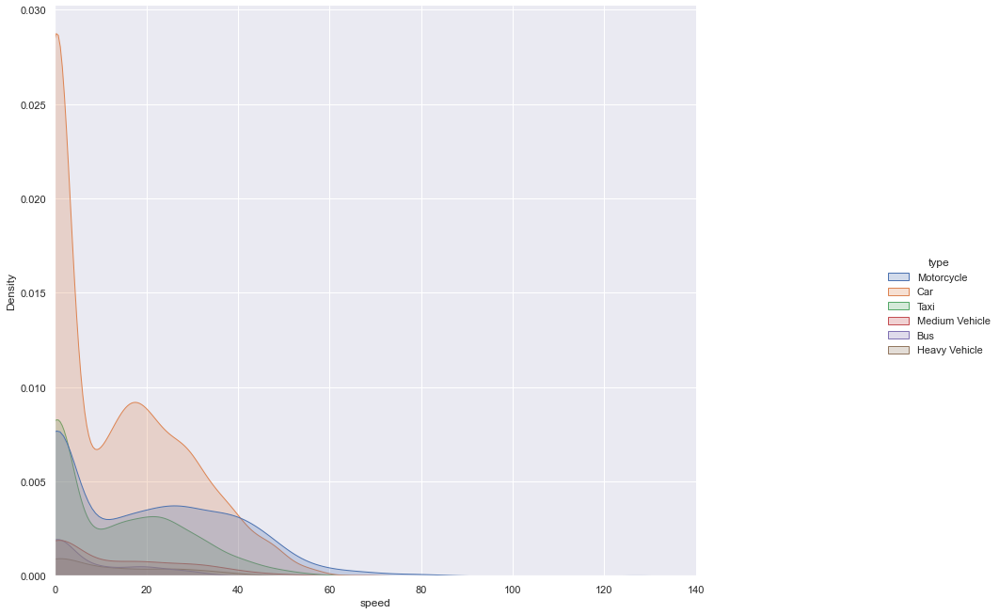

In [5]:
g = sns.displot(data=df_pretest, x="speed", hue="type",kind='kde',fill=True)
g.set_titles("distribution for speed")
g.fig.set_size_inches(16,10)
plt.xlim(0,140)

(-5.0, 5.0)

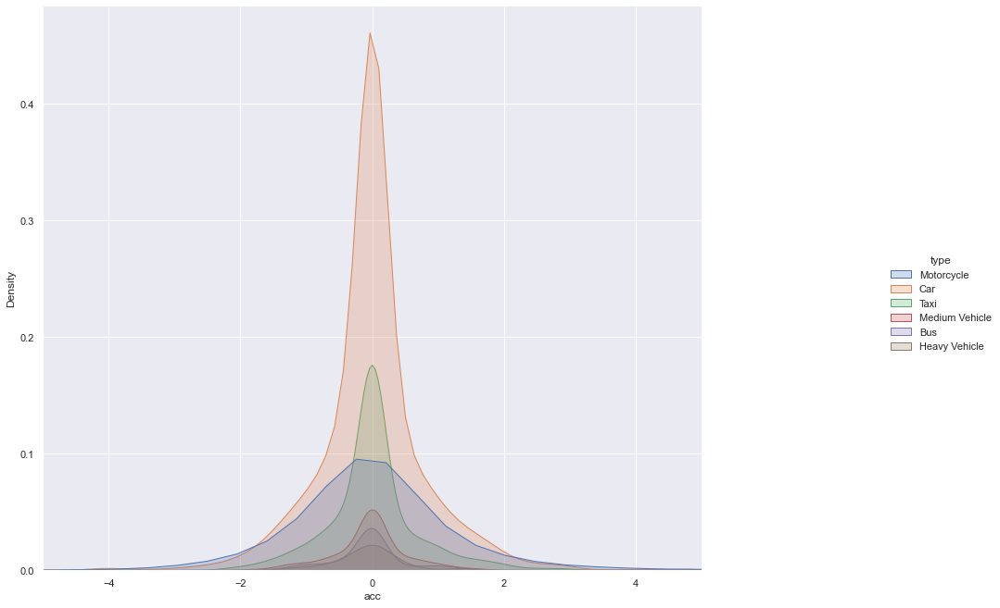

In [6]:
g = sns.displot(data=df_pretest, x="acc", hue="type",kind='kde',fill=True)
g.fig.set_size_inches(16,10)
plt.xlim(-5,5)

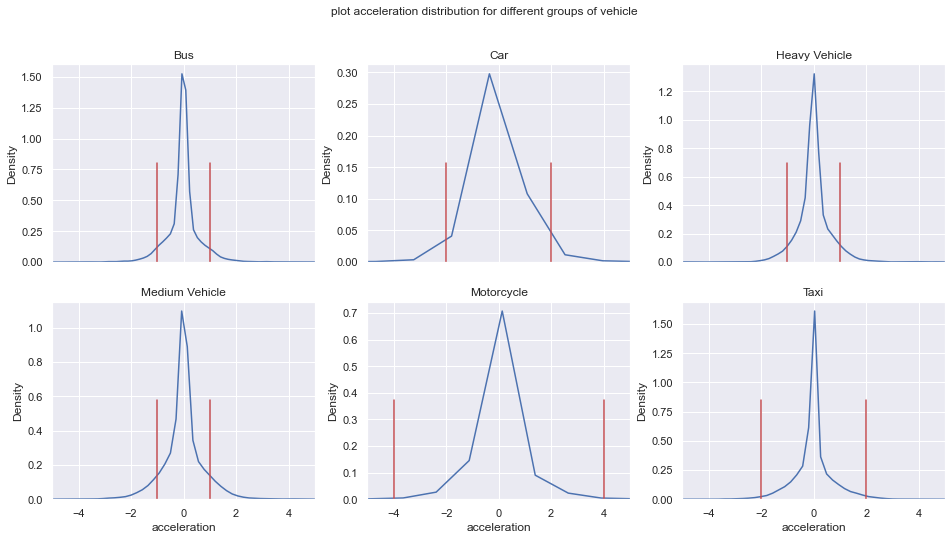

In [7]:
vehicle_type_range = list(acc_groupby_vehicle.index)
fig, axes = plt.subplots(2, 3, sharex=True, figsize=(16,8))
acc_set = {'Bus':[-1,1],'Medium Vehicle':[-1,1],'Heavy Vehicle':[-1,1],'Car':[-2,2],'Taxi':[-2,2],'Motorcycle':[-4,4]}
fig.suptitle('plot acceleration distribution for different groups of vehicle')
for i,name in enumerate(vehicle_type_range):
    rows = int(i/3)
    cols = i%3
    sns.kdeplot(ax = axes[rows][cols],data=acc_groupby_vehicle[i])
    axes[rows][cols].set_title(name)
    axes[rows][cols].set_xlabel('acceleration')
    axes[rows][cols].set_xlim(left=-5, right=5)
    axes[rows][cols].axvline(acc_set[name][0], 0,0.5, color='r')
    axes[rows][cols].axvline(acc_set[name][1], 0,0.5, color='r')

# 1.1 Investigate on CNOSSOS

("![image info](intersection.PNG)")

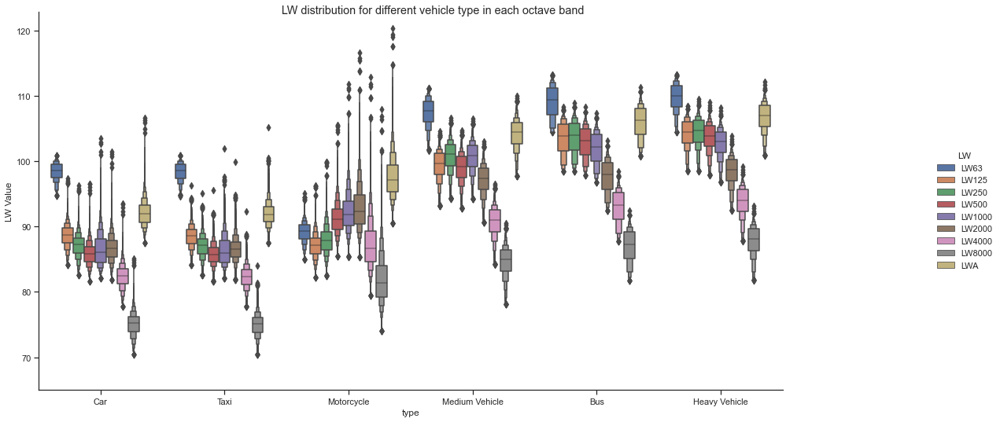

In [8]:
sns.set(rc={'figure.figsize':(20,16)})
sns.set_style("ticks")
res = ['LW63', 'LW125', 'LW250', 'LW500', 'LW1000', 'LW2000', 'LW4000', 'LW8000','LWA','type']
df_test_CN_plot = pd.melt(df_test_CN[res], id_vars="type", var_name="LW", value_name="LW Value")
g = sns.catplot(x='type', y='LW Value', hue='LW', data=df_test_CN_plot, kind='boxen',order=['Car','Taxi','Motorcycle','Medium Vehicle','Bus','Heavy Vehicle'])
g.fig.set_size_inches(20,8)
g.set(ylim=(65, None))
g.fig.suptitle("LW distribution for different vehicle type in each octave band")
plt.show()

1. By applying acoustic average, LWA is larger than most of the LW in each octave band except for the LW63
2. In CNOSSOS model, car and taxi has the lowest average LWA, followed by the motorcycle, then medium vehicle, bus and heavy vehicle

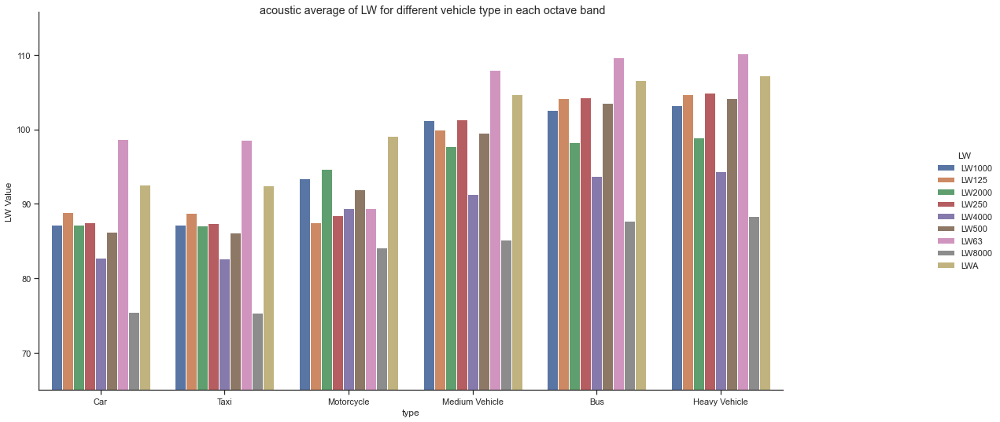

In [9]:
df_test_CN_plot2 = pd.melt(df_test_CN[res], id_vars="type", var_name="LW", value_name="LW Value").groupby(['type','LW']).apply(acoustic_average).\
    to_frame().reset_index().rename(columns={0:"LW Value"})
g = sns.catplot(x='type', y='LW Value', hue='LW', data=df_test_CN_plot2, kind='bar',order=['Car','Taxi','Motorcycle','Medium Vehicle','Bus','Heavy Vehicle'])
g.fig.set_size_inches(20,8)
g.set(ylim=(65, None))
g.fig.suptitle("acoustic average of LW for different vehicle type in each octave band")
plt.show()

In [10]:
"""
Here we extend the speed range
"""
data = dataReading()
df_time_low = Preprocess(data,False,True)
df_time_low,df_CI,df_CN = NoiseCalculation(df_time_low)

In [11]:
m = map_plot(df_CN,single=True)
m

(not consider propogation, by simply consider combination of gaussian distribution for noise source)In this map, we can see that the intersections generates largest noise especially when the vehicles are blocked together.

# 2 Compare CNOSSOS with two acceleration term seperateyly

("![image info](thoughts.PNG)")

## 2.1 difference based on distance to intersection and acceleration

In [12]:
"""
the difference of the two models are caused by different acceleration term, \
    so we focus on the value contribute to it -> acceleration and distance to signalized intersection
"""

'\nthe difference of the two models are caused by different acceleration term,     so we focus on the value contribute to it -> acceleration and distance to signalized intersection\n'

### distance

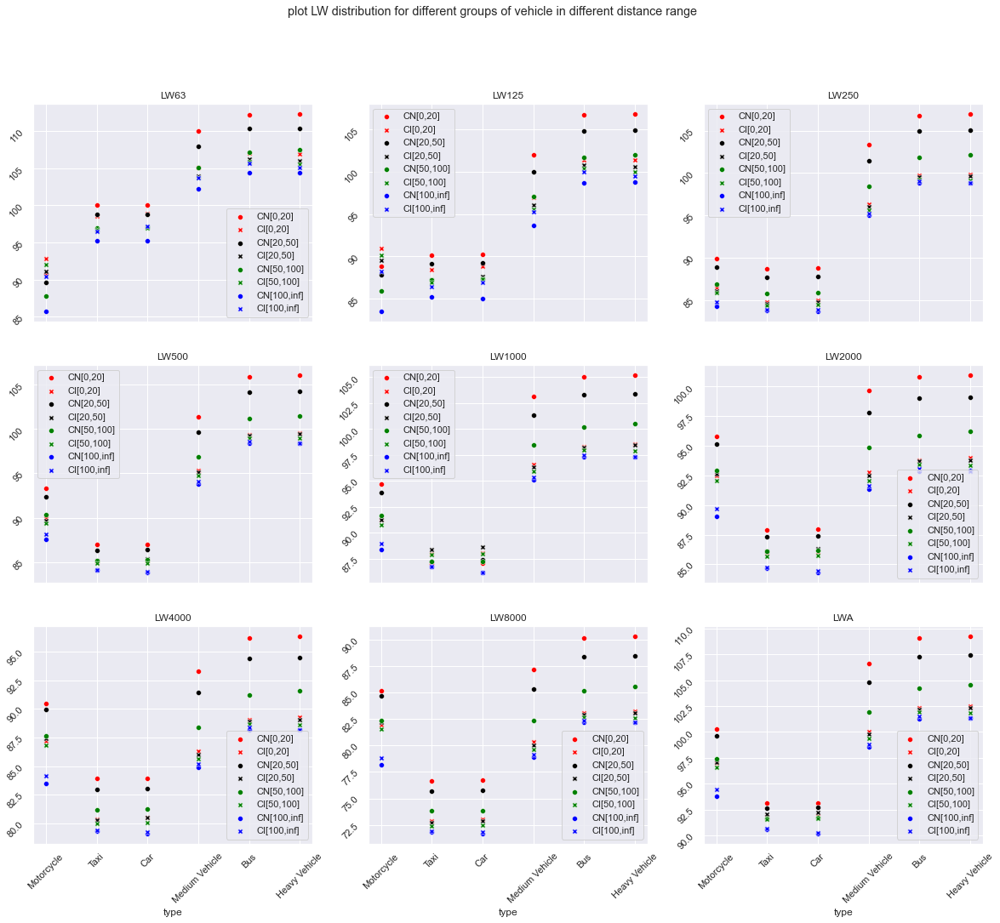

In [13]:
sns.set(rc={'figure.figsize':(20,16)})
fig, axes = plt.subplots(3, 3, sharex=True, figsize=(20,16))
fig.suptitle('plot LW distribution for different groups of vehicle in different distance range')
res = ['LW63', 'LW125', 'LW250', 'LW500', 'LW1000', 'LW2000', 'LW4000', 'LW8000','LWA']
for i,name in enumerate(res):
    rows = int(i/3)
    cols = i%3

    plot_data = df_test_CN[df_test_CN['distance']<=20].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(ax = axes[rows][cols],x=plot_data.index,y=plot_data.values,label='CN[0,20]',color='red')
    plot_data = df_test_CI[df_test_CI['distance']<=20].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(ax = axes[rows][cols],x=plot_data.index,y=plot_data.values,label='CI[0,20]',marker="X",color='red')

    plot_data = df_test_CN[df_test_CN['distance'].between(20,50,inclusive='neither')].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(ax = axes[rows][cols],x=plot_data.index,y=plot_data.values,label='CN[20,50]',color='black')
    plot_data = df_test_CI[df_test_CI['distance'].between(20,50,inclusive='neither')].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(ax = axes[rows][cols],x=plot_data.index,y=plot_data.values,label='CI[20,50]',marker="X",color='black')

    plot_data = df_test_CN[df_test_CN['distance'].between(50,100,inclusive='neither')].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(ax = axes[rows][cols],x=plot_data.index,y=plot_data.values,label='CN[50,100]',color='green')
    plot_data = df_test_CI[df_test_CI['distance'].between(50,100,inclusive='neither')].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(ax = axes[rows][cols],x=plot_data.index,y=plot_data.values,label='CI[50,100]',marker="X",color='green')

    plot_data = df_test_CN[df_test_CN['distance']>=100].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(ax = axes[rows][cols],x=plot_data.index,y=plot_data.values,label='CN[100,inf]',color='blue')
    plot_data = df_test_CI[df_test_CI['distance']>=100].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(ax = axes[rows][cols],x=plot_data.index,y=plot_data.values,label='CI[100,inf]',marker="X",color='blue')

    axes[rows][cols].set_title(name)
    axes[rows][cols].tick_params(labelrotation=45)
plt.savefig("images/LW_distance")

1. Model with imagine acceleration is not seperable with distance term, which refuse the hypothesis of the CNOSSOS acceleration model. 
2. To compare difference between two models (distance, acceleration).The Origin CNOSSOS model overestimate the noise generation.  But the difference is made by the acceleration term range. For motorcycle, the acceleration term for imagine is larger. Because the acc range is [-4,4], which includes most documents for motorcycle. So, next figure, we look into whether inside the acceleration range, the acc term appears similar.
3. To compare difference between different distance group (speed). The smaller the distance, the larger the noise emission for CNOSSOS model. Beside distance, speed also influence the results. With the boxplot, we could see the [20,50] distance group has largest speed, so the noise for this group is close to the [0,20] group. Therefore, the results on this figure is domained by the acceleration term, and speed also contributes a lot. 
4. To compare difference between vehicle type (speed, acc, distance).For the car and taxi, the CNOSSOS is only slighly higher than imagines. It could be explained by the CNOSSOS factor for distance, the proporsion factor is higher for medium vehicle, bus and heavy vehicle (about 2 times larger) thought the imagine acceleration noise is larger for them while it could't make up the difference.
5. (Speed) The most interesting part comes from the motorcycle, the difference between the two models are larger than bus&taxi but smaller than others. Actually, the acceleration factor is the same with type 1 in this case. Therefore, we look into the acceleration and speed distribution based on the motorcycle, the motorcycle has the highest acceleration and speed, which means higher noise in both model than taxi and car. Additionally, the acceleration calculation range for different types of vehicle, the motrocycle has a largest proportion noise due to it high acc range alothough the parameters are the same with type 1.  To look into the problem, we plot the same figure for the noise generated by acceleration term.

#### look into the reason

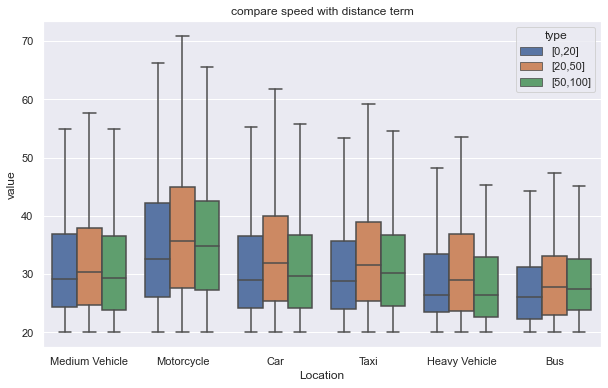

In [96]:
plt.figure(figsize=(10,6))
plt.title("compare speed with distance term")
data_plot = dict()
for i,name in enumerate(df_time.type.unique()):
    rows = int(i/3)
    cols = i%3
    concat_m = df_time[df_time['distance']<=20][df_time[df_time['distance']<=20].type == name]['speed']
    concat_n = df_time[df_time['distance'].between(20,50,inclusive='neither')][df_time[df_time['distance'].between(20,50,inclusive='neither')].type==name]['speed']
    concat_s = df_time[df_time['distance'].between(50,100,inclusive='neither')][df_time[df_time['distance'].between(50,100,inclusive='neither')].type==name]['speed']
    length = min(len(concat_m),len(concat_n))
    concat_m = concat_m[:length]
    concat_n = concat_n[:length]
    concat_s = concat_s[:length]
    data = pd.DataFrame({'[0,20]':concat_m,'[20,50]':concat_n,'[50,100]':concat_s}).assign(Location=name)
    data_plot[i] = data
cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4],data_plot[5]])
mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])   
sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)    
plt.show()

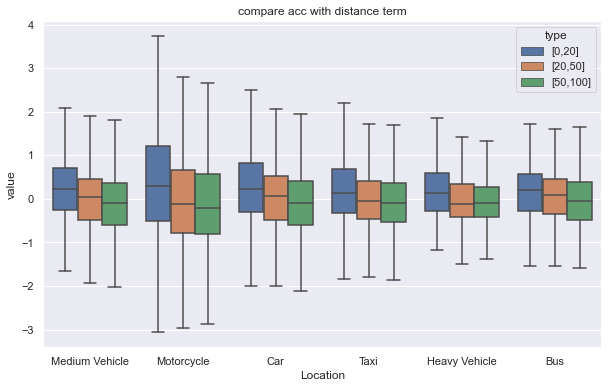

In [95]:
plt.figure(figsize=(10,6))
plt.title("compare acc with distance term")
data_plot = dict()
for i,name in enumerate(df_time.type.unique()):
    rows = int(i/3)
    cols = i%3
    concat_m = df_time[df_time['distance']<=20][df_time[df_time['distance']<=20].type == name]['acc']
    concat_n = df_time[df_time['distance'].between(20,50,inclusive='neither')][df_time[df_time['distance'].between(20,50,inclusive='neither')].type==name]['acc']
    concat_s = df_time[df_time['distance'].between(50,100,inclusive='neither')][df_time[df_time['distance'].between(50,100,inclusive='neither')].type==name]['acc']
    length = min(len(concat_m),len(concat_n))
    concat_m = concat_m[:length]
    concat_n = concat_n[:length]
    concat_s = concat_s[:length]
    data = pd.DataFrame({'[0,20]':concat_m,'[20,50]':concat_n,'[50,100]':concat_s}).assign(Location=name)
    data_plot[i] = data
cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4],data_plot[5]])
mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])   
sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)    
plt.show()

#### search the distribution of acceleration term

In [34]:
df_test_CN['Lw_a'] = df_test_CN.apply(lambda x:acoustic_average([x.Lwr_acc,x.Lwp_acc]),axis=1)
df_test_CI['Lw_a'] = df_test_CI.Lwp_acc

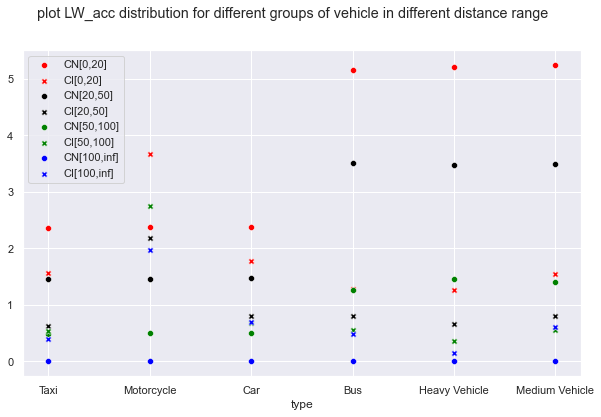

In [62]:
fig, axes = plt.subplots(1, 1, sharex=True, figsize=(10,6))
fig.suptitle('plot LW_acc distribution for different groups of vehicle in different distance range')
for i,name in enumerate(['Lw_a']):

    plot_data = df_test_CN[df_test_CN['distance']<=20].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN[0,20]',color='red')
    plot_data = df_test_CI[df_test_CI['distance']<=20].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI[0,20]',marker="X",color='red')

    plot_data = df_test_CN[df_test_CN['distance'].between(20,50,inclusive='neither')].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN[20,50]',color='black')
    plot_data = df_test_CI[df_test_CI['distance'].between(20,50,inclusive='neither')].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI[20,50]',marker="X",color='black')

    plot_data = df_test_CN[df_test_CN['distance'].between(50,100,inclusive='neither')].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN[50,100]',color='green')
    plot_data = df_test_CI[df_test_CI['distance'].between(50,100,inclusive='neither')].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI[50,100]',marker="X",color='green')

    plot_data = df_test_CN[df_test_CN['distance']>=100].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN[100,inf]',color='blue')
    plot_data = df_test_CI[df_test_CI['distance']>=100].groupby('type')[name].apply(acoustic_average).sort_values()
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI[100,inf]',marker="X",color='blue')


### acc

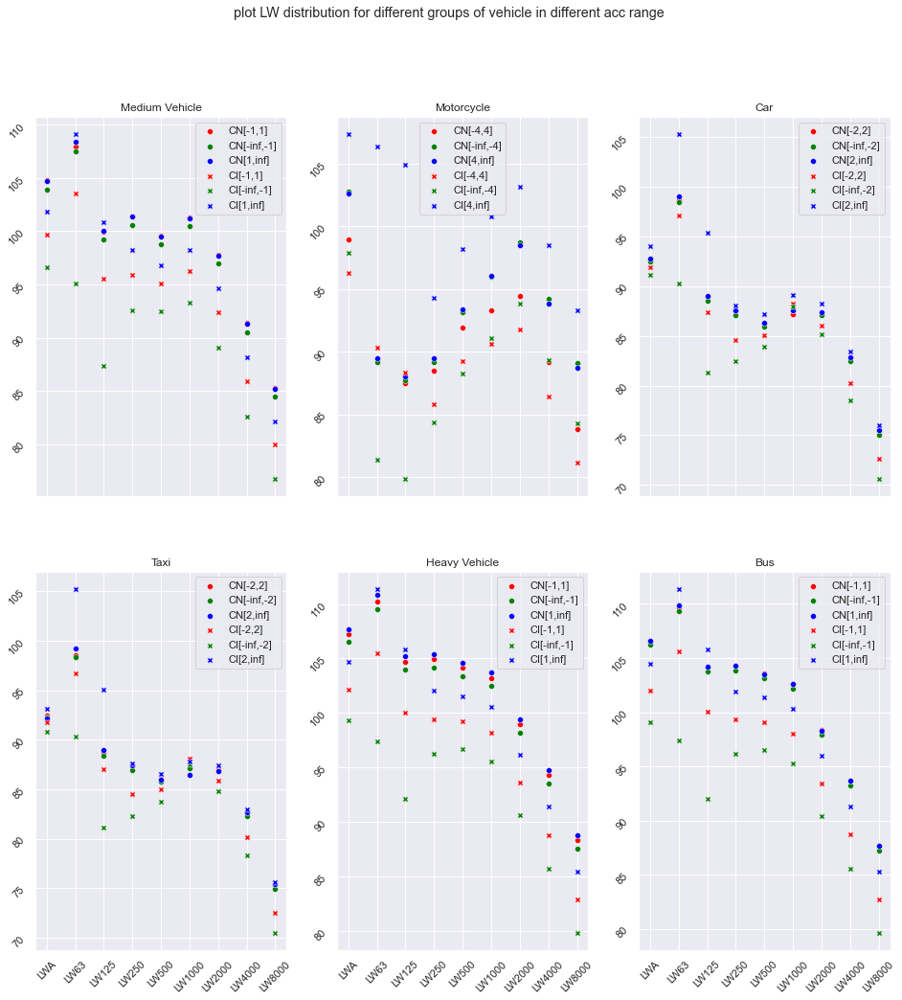

In [9]:
# near the intersection (acc dcit = {1:[-2,2],2:[-1,1],3:[-1,1],4:[-4,4]})
# x:LW1 - LW8 - LWA, y : value, title: for each vehicle type , comapre : at different acc
fig, axes = plt.subplots(2, 3, sharex=True, figsize=(16,16))
fig.suptitle('plot LW distribution for different groups of vehicle in different acc range')
acc_set = {'Bus':[-1,1],'Medium Vehicle':[-1,1],'Heavy Vehicle':[-1,1],'Car':[-2,2],'Taxi':[-2,2],'Motorcycle':[-4,4]}
for i,name in enumerate(df_time.type.unique()):
    rows = int(i/3)
    cols = i%3

    acc_range = acc_set[name]
    data_plot = df_test_CN[df_test_CN.type == name]
    plot_data = data_plot[data_plot['acc'].between(acc_range[0],acc_range[1])][res].apply(acoustic_average)
    sns.scatterplot(data=plot_data,ax = axes[rows][cols],label = 'CN[{},{}]'.format(acc_range[0],acc_range[1]),color='red')
    plot_data = data_plot[data_plot['acc']<=acc_range[0]][res].apply(acoustic_average)
    sns.scatterplot(data=plot_data,ax = axes[rows][cols],label = 'CN[-inf,{}]'.format(acc_range[0]),color='green')
    plot_data = data_plot[data_plot['acc']>=acc_range[1]][res].apply(acoustic_average)
    sns.scatterplot(data=plot_data,ax = axes[rows][cols],label = 'CN[{},inf]'.format(acc_range[1]),color='blue')

    data_plot = df_test_CI[df_test_CI.type == name]
    plot_data = data_plot[data_plot['acc'].between(acc_range[0],acc_range[1])][res].apply(acoustic_average)
    sns.scatterplot(data=plot_data,marker="X",ax = axes[rows][cols],label = 'CI[{},{}]'.format(acc_range[0],acc_range[1]),color='red')
    plot_data = data_plot[data_plot['acc']<=acc_range[0]][res].apply(acoustic_average)
    sns.scatterplot(data=plot_data,marker="X",ax = axes[rows][cols],label = 'CI[-inf,{}]'.format(acc_range[0]),color='green')
    plot_data = data_plot[data_plot['acc']>=acc_range[1]][res].apply(acoustic_average)
    sns.scatterplot(data=plot_data,marker="X",ax = axes[rows][cols],label = 'CI[{},inf]'.format(acc_range[1]),color='blue')


    axes[rows][cols].set_title(name)
    axes[rows][cols].tick_params(labelrotation=45)
plt.savefig("images/LW_acc")

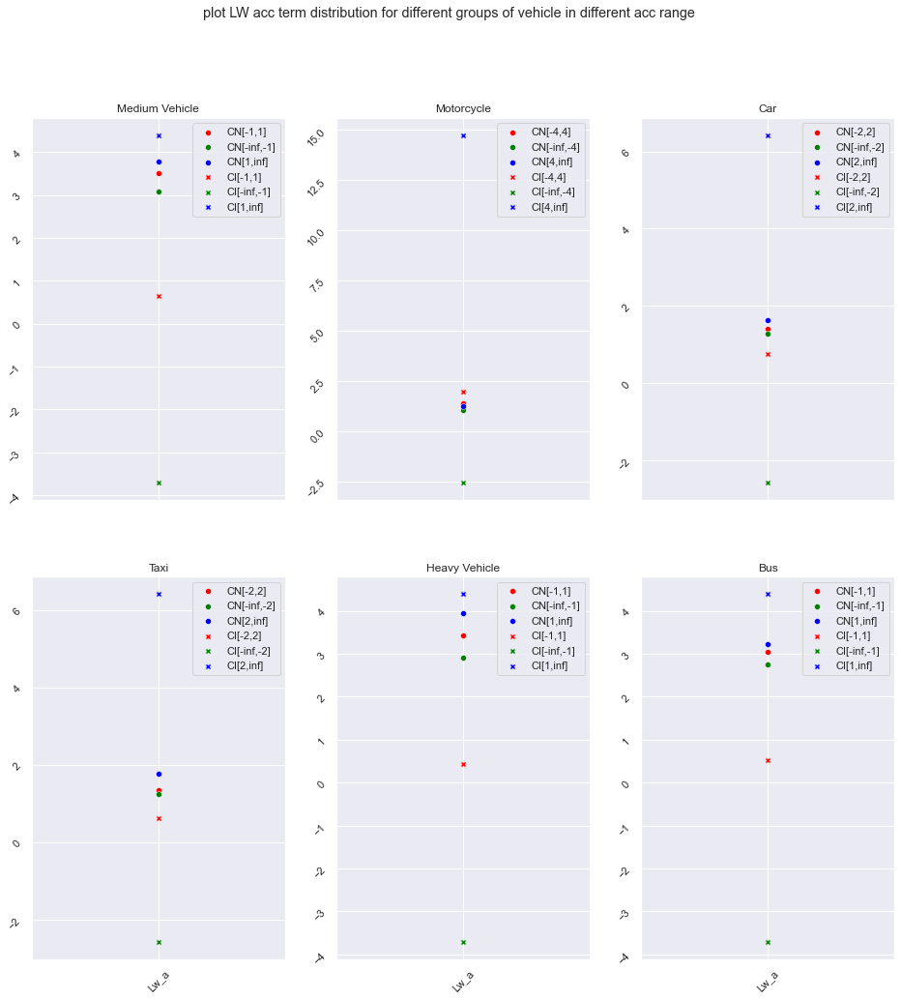

In [38]:
fig, axes = plt.subplots(2, 3, sharex=True, figsize=(16,16))
fig.suptitle('plot LW acc term distribution for different groups of vehicle in different acc range')
acc_set = {'Bus':[-1,1],'Medium Vehicle':[-1,1],'Heavy Vehicle':[-1,1],'Car':[-2,2],'Taxi':[-2,2],'Motorcycle':[-4,4]}
res1 = ['Lw_a']
for i,name in enumerate(df_time.type.unique()):
    rows = int(i/3)
    cols = i%3

    acc_range = acc_set[name]
    data_plot = df_test_CN[df_test_CN.type == name]
    plot_data = data_plot[data_plot['acc'].between(acc_range[0],acc_range[1])][res1].apply(acoustic_average)
    sns.scatterplot(data=plot_data,ax = axes[rows][cols],label = 'CN[{},{}]'.format(acc_range[0],acc_range[1]),color='red')
    plot_data = data_plot[data_plot['acc']<=acc_range[0]][res1].apply(acoustic_average)
    sns.scatterplot(data=plot_data,ax = axes[rows][cols],label = 'CN[-inf,{}]'.format(acc_range[0]),color='green')
    plot_data = data_plot[data_plot['acc']>=acc_range[1]][res1].apply(acoustic_average)
    sns.scatterplot(data=plot_data,ax = axes[rows][cols],label = 'CN[{},inf]'.format(acc_range[1]),color='blue')

    data_plot = df_test_CI[df_test_CI.type == name]
    plot_data = data_plot[data_plot['acc'].between(acc_range[0],acc_range[1])][res1].apply(acoustic_average)
    sns.scatterplot(data=plot_data,marker="X",ax = axes[rows][cols],label = 'CI[{},{}]'.format(acc_range[0],acc_range[1]),color='red')
    plot_data = data_plot[data_plot['acc']<=acc_range[0]][res1].apply(acoustic_average)
    sns.scatterplot(data=plot_data,marker="X",ax = axes[rows][cols],label = 'CI[-inf,{}]'.format(acc_range[0]),color='green')
    plot_data = data_plot[data_plot['acc']>=acc_range[1]][res1].apply(acoustic_average)
    sns.scatterplot(data=plot_data,marker="X",ax = axes[rows][cols],label = 'CI[{},inf]'.format(acc_range[1]),color='blue')


    axes[rows][cols].set_title(name)
    axes[rows][cols].tick_params(labelrotation=45)
plt.savefig("images/Lw_a_acc")

1. To illustrate the point for acceleration range, we look into the results of acc additional noise, it's quite amazing that imagine acc term predicts larger noise than cnossos when the acc is over its range. And the within majority range, CI[-4,4] is larger than CN[-4,4] for motor, which explains the special performance of the motorcycle. We can broad the acc range to let imagine term closer to cnossos', but we should know the acc term is quite different from the composition.

In [106]:
scipy.stats.pearsonr(df_time.distance[:100],df_time.acc[:100])

PearsonRResult(statistic=-0.09893430956449989, pvalue=0.3274269513629937)

In [107]:
scipy.stats.pearsonr(df_time.distance[:10000],df_time.acc[:10000])

PearsonRResult(statistic=-0.04463540903472095, pvalue=7.999089936163528e-06)

In [108]:
scipy.stats.pearsonr(df_time.distance,df_time.acc)

PearsonRResult(statistic=-0.06806170779762084, pvalue=3.1060535440024237e-82)

## 2.2 position based investigation

### 2.2.1 different part in one main road 

In [15]:
def isInRectangle(x):
    """to determine whether the point lies inside the rectangle

    Args:
        x (array(latitude,lontitude)): position

    Returns:
        bool: True indicate the points inside the rectangle
    """
    AB = right_top - left_top
    AO = x - left_top
    CD = left_bottom - right_bottom
    CO = x - right_bottom
    DA = left_top - left_bottom
    DO = x - left_bottom
    BC = right_bottom - right_top
    BO = x - right_top
    return np.cross(AB,AO)*np.cross(CD,CO) >= 0 and np.cross(DA,DO)*np.cross(BC,BO) >= 0
    
# whole cell
left_top = np.array([37.99168400924834, 23.732502251146954])
left_bottom = np.array([37.9915549499682, 23.73250848615584])
right_top = np.array([37.99143636093534, 23.73400107173722])
right_bottom = np.array([37.99131718174004, 23.73400615972513])
df_CI_main1 = df_test_CI[df_test_CI.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]
df_CN_main1 = df_test_CN[df_test_CN.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]
# middle point to front intersection
left_top = np.array([37.99168974180253, 23.732492057409942])
left_bottom = np.array([37.99156831563185, 23.73245086188028])
right_top = np.array([37.991545146185246, 23.733218364932547])
right_bottom = np.array([37.99147806927299, 23.73300486466455])
df_CI_main2 = df_test_CI[df_test_CI.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]
df_CN_main2 = df_test_CN[df_test_CN.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]
# middle point to behind intersection
left_top = np.array([37.991545146185246, 23.733218364932547])
left_bottom = np.array([37.99147806927299, 23.73300486466455])
right_top = np.array([37.99144312384521, 23.73397110383178])
right_bottom = np.array([37.99132728213509, 23.733999186902064])
df_CI_main3 = df_test_CI[df_test_CI.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]
df_CN_main3 = df_test_CN[df_test_CN.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]

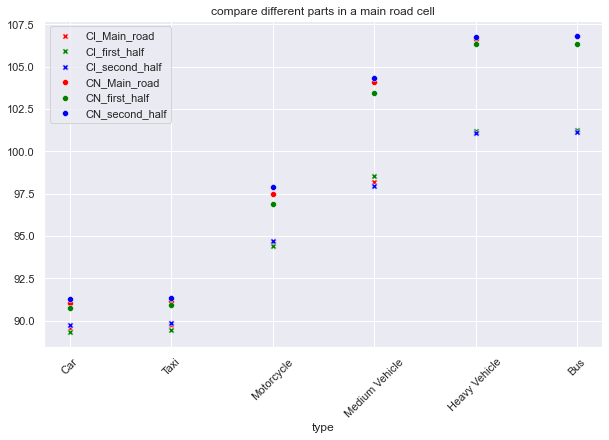

In [99]:
plt.figure(figsize=(10,6))
plt.title("compare different parts in a main road cell")
sns.scatterplot(data=df_CI_main1[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CI_Main_road',color='red',marker="X")
sns.scatterplot(data=df_CI_main2[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CI_first_half',color='green',marker="X")
sns.scatterplot(data=df_CI_main3[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CI_second_half',color='blue',marker="X")
sns.scatterplot(data=df_CN_main1[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CN_Main_road',color='red')
sns.scatterplot(data=df_CN_main2[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CN_first_half',color='green')
sns.scatterplot(data=df_CN_main3[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CN_second_half',color='blue')
plt.xticks(rotation=45)
plt.savefig("images/LW_main_section")
plt.show()
# distribution acc speed distance

1. To compare the two models, the results is the same - CNOSSOS overestimate and the difference for car, taxi is the least.
2. To compare different area. We look through the speed, the second half has larger speed than the first half. In this way, blue point is the largest most of the time. While for model with imagine acceleration term, the second half produce less noise in medium vehicle, heavy vehilce and bus. Since the second half has larger acceleration, and for these 3 kinds of vehicle, the factor for acceleration term is larger than others.

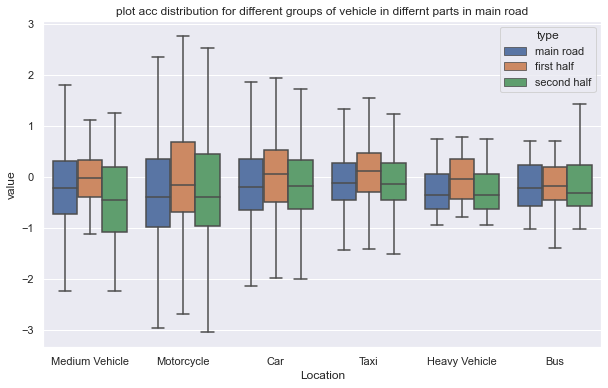

In [93]:
def compare_plot(dtype='acc'):
    plt.figure(figsize=(10,6))
    plt.title('plot acc distribution for different groups of vehicle in differnt parts in main road')
    data_plot = dict()
    for i,name in enumerate(df_time.type.unique()):
        rows = int(i/3)
        cols = i%3
        concat_m = df_CI_main1[df_CI_main1.type == name][dtype]
        concat_n = df_CI_main2[df_CI_main2.type == name][dtype]
        concat_s = df_CI_main3[df_CI_main3.type == name][dtype]
        length = min(len(concat_m),len(concat_n),len(concat_s))
        concat_m = concat_m[:length]
        concat_n = concat_n[:length]
        concat_s = concat_s[:length]
        data = pd.DataFrame({'main road':concat_m,'first half':concat_n,'second half':concat_s}).assign(Location=name)
        data_plot[i] = data
    cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4],data_plot[5]])
    mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])   
    sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)      
    plt.show()
compare_plot('acc')

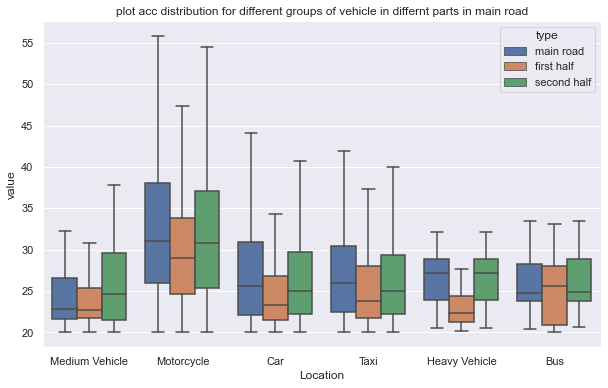

In [94]:
compare_plot('speed')

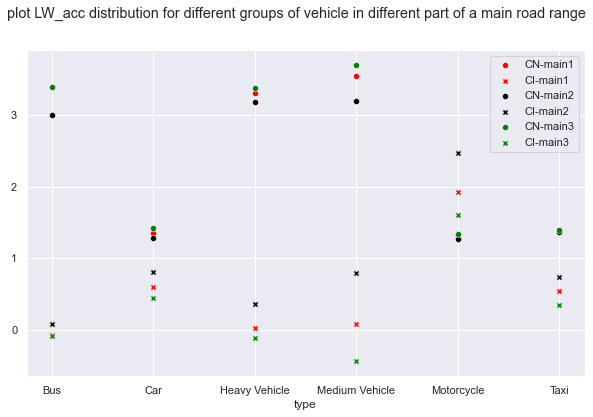

In [78]:
fig, axes = plt.subplots(1, 1, sharex=True, figsize=(10,6))
fig.suptitle('plot LW_acc distribution for different groups of vehicle in different part of a main road range')
for i,name in enumerate(['Lw_a']):

    plot_data = df_CN_main1.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN-main1',color='red')
    plot_data = df_CI_main1.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI-main1',marker="X",color='red')

    plot_data = df_CN_main2.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN-main2',color='black')
    plot_data = df_CI_main2.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI-main2',marker="X",color='black')

    plot_data = df_CN_main3.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN-main3',color='green')
    plot_data = df_CI_main3.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI-main3',marker="X",color='green')

In [109]:
def add_median_labels(ax, fmt='.1f'):
    lines = ax.get_lines()
    boxes = [c for c in ax.get_children() if type(c).__name__ == 'PathPatch']
    lines_per_box = int(len(lines) / len(boxes))
    for median in lines[4:len(lines):lines_per_box]:
        x, y = (data.mean() for data in median.get_data())
        # choose value depending on horizontal or vertical plot orientation
        value = x if (median.get_xdata()[1] - median.get_xdata()[0]) == 0 else y
        text = ax.text(x, y, f'{value:{fmt}}', ha='center', va='center',
                       fontweight='bold', color='white')
        # create median-colored border around white text for contrast
        text.set_path_effects([
            path_effects.Stroke(linewidth=3, foreground=median.get_color()),
            path_effects.Normal(),
        ])
# plt.figure(figsize=(16,10))
# plt.title("compare distance to intersection for the driving states")
# data_plot = dict()
# for i,name in enumerate(df_time.type.unique()):
#     rows = int(i/3)
#     cols = i%3
#     concat_m = df_CI_main1[df_CI_main1.type==name]['Lwr'] .apply(lambda x:1-x/100 if 1-x/100 > 0 else 0).values
#     concat_n = df_CI_main2[df_CI_main2.type==name]['Lwr']# .apply(lambda x:1-x/100  if 1-x/100 > 0 else 0).values
#     concat_s = df_CI_main3[df_CI_main3.type==name]['Lwr']

#     length = min(len(concat_m),len(concat_n))
#     concat_m = concat_m[:length]
#     concat_n = concat_n[:length]
#     concat_s = concat_s[:length]
#     data = pd.DataFrame({'MAIN1':concat_m,'MAIN2':concat_n,'MAIN3':concat_s}).assign(Location=name)
#     data_plot[i] = data
# cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4]])
# mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])
# ax = sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)  
# add_median_labels(ax)  
# # plt.xticks(rotation=45)
# plt.show()

### 2.2.2 main road with branch road

("![image info](mainRoad.PNG)")

("![image info](branches.PNG)")

In [41]:
# main road
left_top = np.array([37.99179834971345, 23.73191193783444]) # show range of the area
left_bottom = np.array([37.99154047987973, 23.731921554684806])
right_top = np.array([37.99118288187797, 23.73566365039552])
right_bottom = np.array([37.9909179865472, 23.735624435987713])
df_CI_main = df_test_CI[df_test_CI.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]
df_CN_main = df_test_CN[df_test_CN.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]

# small road
left_top = np.array([37.991490141138, 23.732255933280655])
left_bottom = np.array([37.989778291127074, 23.731825984498187])
right_top = np.array([37.99094320301187, 23.73560938310328])
right_bottom = np.array([37.98922521050924, 23.735194828144692])
df_CI_Small = df_test_CI[df_test_CI.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]
df_CN_Small = df_test_CN[df_test_CN.apply(lambda x:isInRectangle(np.array([x.lat,x.lon])),axis=1)]

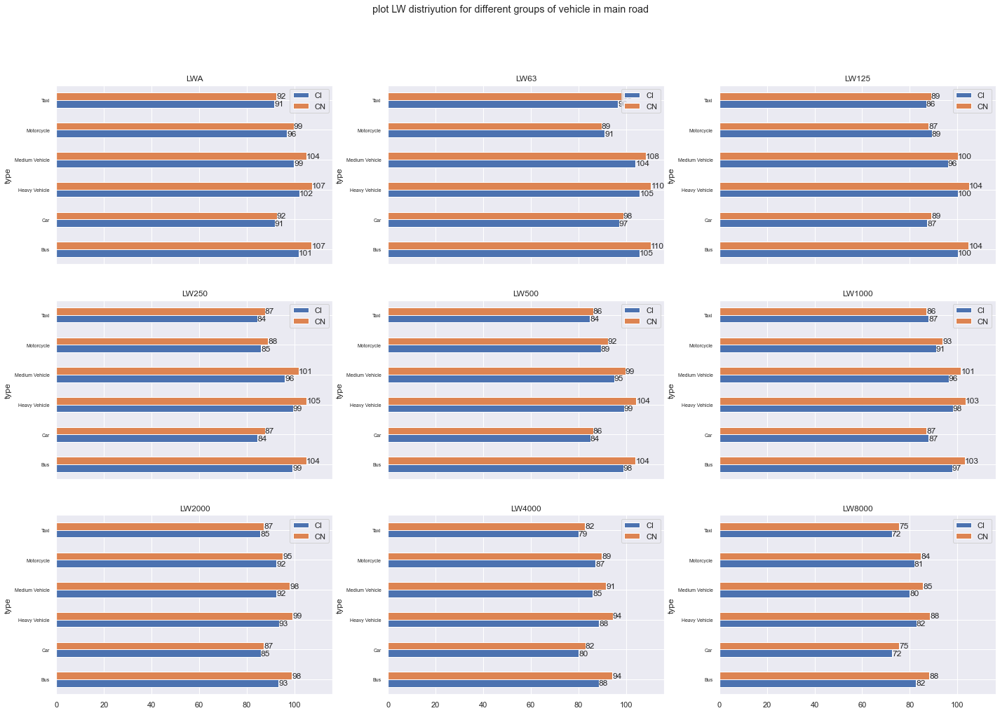

In [42]:
# we use the barplot
fig, axes = plt.subplots(3, 3, sharex=True, figsize=(24,16))
fig.suptitle('plot LW distriyution for different groups of vehicle in main road')
res = ['LWA','LW63', 'LW125', 'LW250', 'LW500', 'LW1000', 'LW2000', 'LW4000', 'LW8000']
for i,name in enumerate(res):
    rows = int(i/3)
    cols = i%3
    plot_title = name
    plt.title(plot_title)
    x1 = df_CI_main[[plot_title,'type']].groupby('type').apply(acoustic_average)
    x2 = df_CN_main[[plot_title,'type']].groupby('type').apply(acoustic_average)
    
    gugu =pd.concat([x1,x2],axis=1).rename(columns={0: 'CI', 1: 'CN'}).reset_index().set_index('type')
    ax = gugu.plot.barh(stacked=False,ax=axes[rows][cols])
    for container in ax.containers:
        ax.bar_label(container,fmt="%d")

    axes[rows][cols].set_title(name)
    axes[rows][cols].set_yticklabels(axes[rows][cols].get_yticklabels(), fontsize=7)
    
plt.savefig("images/LW_main_section_octave")
# not stack

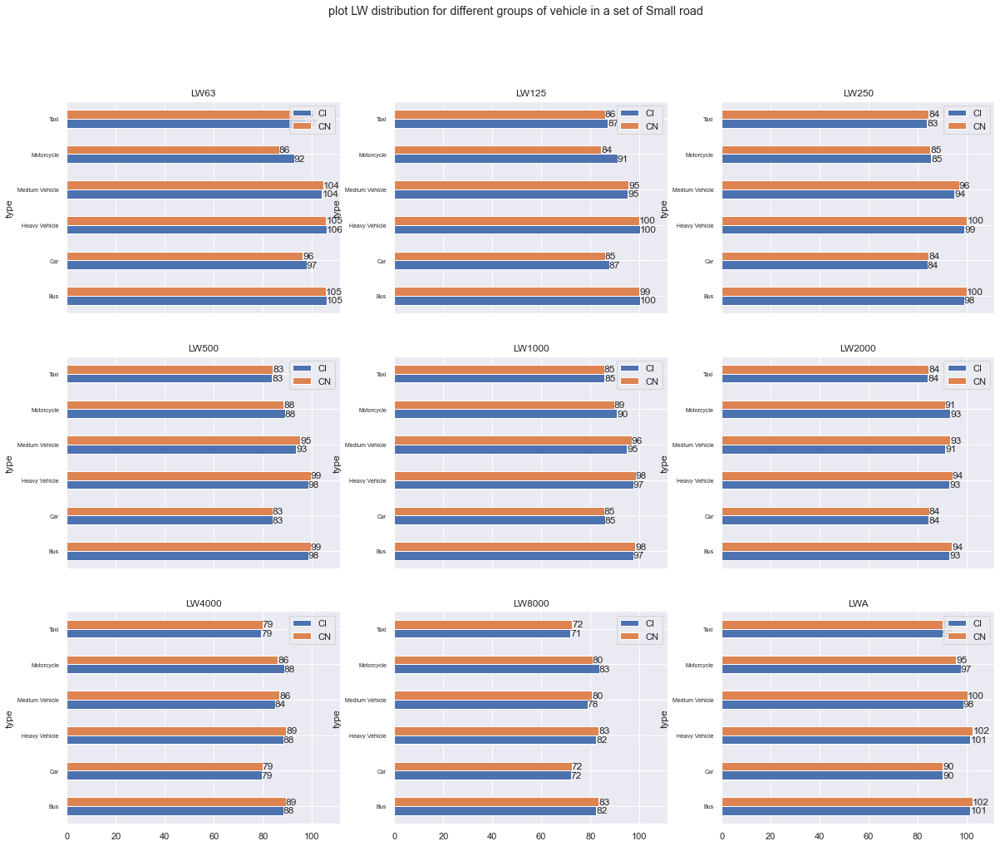

In [43]:
fig, axes = plt.subplots(3, 3, sharex=True, figsize=(20,16))
fig.suptitle('plot LW distribution for different groups of vehicle in a set of Small road')
res = ['LW63', 'LW125', 'LW250', 'LW500', 'LW1000', 'LW2000', 'LW4000', 'LW8000','LWA']
for i,name in enumerate(res):
    rows = int(i/3)
    cols = i%3
    plot_title = name
    plt.title(plot_title)
    x1 = df_CI_Small[[plot_title,'type']].groupby('type').apply(acoustic_average)
    x2 = df_CN_Small[[plot_title,'type']].groupby('type').apply(acoustic_average)
    gugu =pd.concat([x1,x2],axis=1).rename(columns={0: 'CI', 1: 'CN'}).reset_index().set_index('type')
    ax = gugu.plot.barh(stacked=False,ax=axes[rows][cols])
    for container in ax.containers:
        ax.bar_label(container,fmt="%d")

    axes[rows][cols].set_title(name)
    axes[rows][cols].set_yticklabels(axes[rows][cols].get_yticklabels(), fontsize=7)
    # df_bar = pd.concat([x1,x2],axis=1).rename(columns={0: 'CI', 1: 'CN'}).reset_index().melt(id_vars=["type"])
    # g = sns.barplot(data=df_bar,hue='type',x="variable", y="value",ax=axes[rows][cols])
    # g.set(ylim=(70, None))
    # sns.move_legend(g,"lower right")

    axes[rows][cols].set_title(name)
plt.savefig("images/LW_small_section_octave")

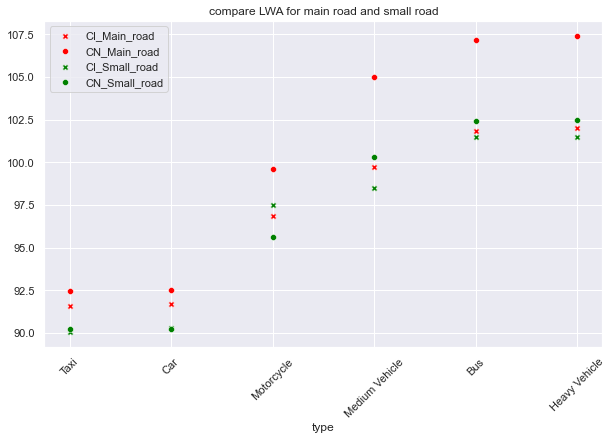

In [44]:
plt.figure(figsize=(10,6))
plt.title("compare LWA for main road and small road")
sns.scatterplot(data=df_CI_main[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CI_Main_road',color='red',marker="X",sizes=50)
sns.scatterplot(data=df_CN_main[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CN_Main_road',color='red',sizes=50)
sns.scatterplot(data=df_CI_Small[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CI_Small_road',marker="X",color='green',sizes=50)
sns.scatterplot(data=df_CN_Small[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),label='CN_Small_road',color='green',sizes=50)
plt.xticks(rotation=45)
plt.show()

1. To compare two models, CNOSSOS in main road is higher, because the distance is main road is much smaller.
2. To compare model in different road, main road produces higher noise for cnossos. It can be explained by the speed and distance and speed. The speed in main road is much larger than that in small road. But in additional imagine acceleration term, except for medium vehicle, others has larger acceleration noise in small road, (very important). Especially for the motorcycle, in this way, CI produces more noise in small road which the influence of the speed.
3. To compare among vehicle, taxi and car has very similar noise for two models in small road. This can be found in the difference for additional acceleration term between CN and CI (black mark X and black mark o).


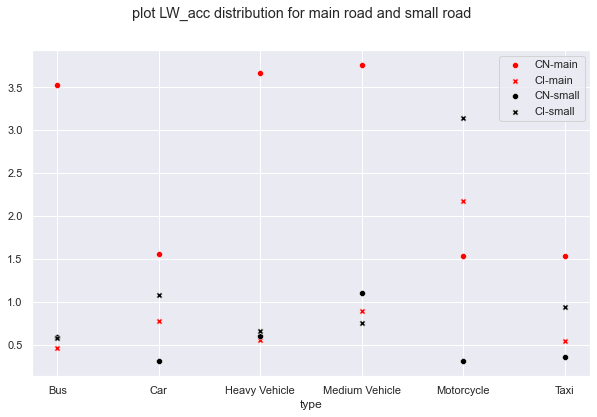

In [45]:
fig, axes = plt.subplots(1, 1, sharex=True, figsize=(10,6))
fig.suptitle('plot LW_acc distribution for main road and small road')
for i,name in enumerate(['Lw_a']):

    plot_data = df_CN_main.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN-main',color='red')
    plot_data = df_CI_main.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI-main',marker="X",color='red')

    plot_data = df_CN_Small.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN-small',color='black')
    plot_data = df_CI_Small.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI-small',marker="X",color='black')


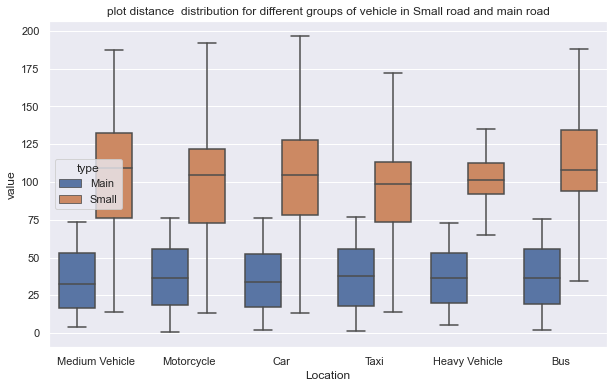

<Figure size 1440x1152 with 0 Axes>

In [98]:
# plt.title('plot distance for intersection distribution for different groups of vehicle in Small road and main road')
plt.figure(figsize=(10,6))
plt.title('plot distance  distribution for different groups of vehicle in Small road and main road')
data_plot = dict()
for i,name in enumerate(df_time.type.unique()):
    # rows = int(i/3)
    # cols = i%3
    concat_m = df_CI_main[df_CI_main.type==name]['distance']# .apply(lambda x:1-x/100 if 1-x/100 > 0 else 0).values
    concat_n = df_CI_Small[df_CI_Small.type==name]['distance']# .apply(lambda x:1-x/100  if 1-x/100 > 0 else 0).values
    length = min(len(concat_m),len(concat_n))
    concat_m = concat_m[:length]
    concat_n = concat_n[:length]
    data = pd.DataFrame({'Main':concat_m,'Small':concat_n}).assign(Location=name)
    data_plot[i] = data
cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4],data_plot[5]])
mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])   
g = sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)    
plt.show()
plt.savefig("images/LW_dis_small_main")

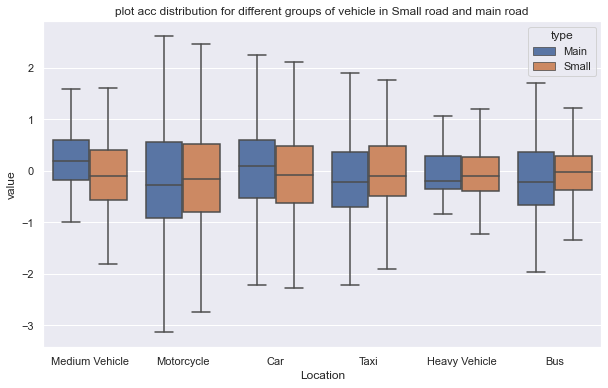

<Figure size 1440x1152 with 0 Axes>

In [90]:
plt.figure(figsize=(10,6))
plt.title('plot acc distribution for different groups of vehicle in Small road and main road')
data_plot = dict()
for i,name in enumerate(df_time.type.unique()):
    # rows = int(i/3)
    # cols = i%3
    concat_m = df_CI_main[df_CI_main.type==name]['acc']# .apply(lambda x:1-x/100 if 1-x/100 > 0 else 0).values
    concat_n = df_CI_Small[df_CI_Small.type==name]['acc']# .apply(lambda x:1-x/100  if 1-x/100 > 0 else 0).values
    length = min(len(concat_m),len(concat_n))
    concat_m = concat_m[:length]
    concat_n = concat_n[:length]
    data = pd.DataFrame({'Main':concat_m,'Small':concat_n}).assign(Location=name)
    data_plot[i] = data
cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4],data_plot[5]])
mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])   
g = sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)    
plt.show()
plt.savefig("images/LW_speed_small_main")

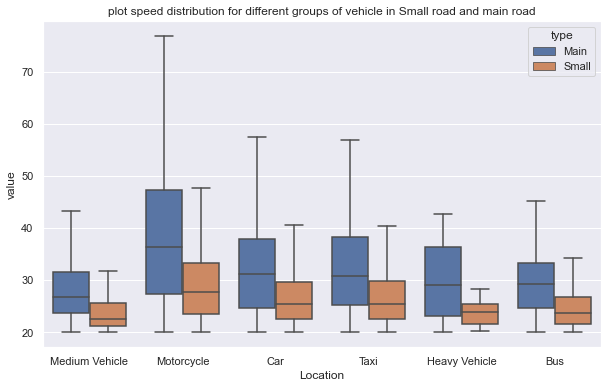

<Figure size 1440x1152 with 0 Axes>

In [89]:
plt.figure(figsize=(10,6))
plt.title('plot speed distribution for different groups of vehicle in Small road and main road')
data_plot = dict()
for i,name in enumerate(df_time.type.unique()):
    # rows = int(i/3)
    # cols = i%3
    concat_m = df_CI_main[df_CI_main.type==name]['speed']# .apply(lambda x:1-x/100 if 1-x/100 > 0 else 0).values
    concat_n = df_CI_Small[df_CI_Small.type==name]['speed']# .apply(lambda x:1-x/100  if 1-x/100 > 0 else 0).values
    length = min(len(concat_m),len(concat_n))
    concat_m = concat_m[:length]
    concat_n = concat_n[:length]
    data = pd.DataFrame({'Main':concat_m,'Small':concat_n}).assign(Location=name)
    data_plot[i] = data
cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4],data_plot[5]])
mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])   
g = sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)    
plt.show()
plt.savefig("images/LW_speed_small_main")

## 2.3 based on driving states

In [51]:
df_CI_acceleration,df_CI_deceleration,df_CI_stable = get_acc_phase(df_test_CI)
df_CN_acceleration,df_CN_deceleration,df_CN_stable = get_acc_phase(df_test_CN)

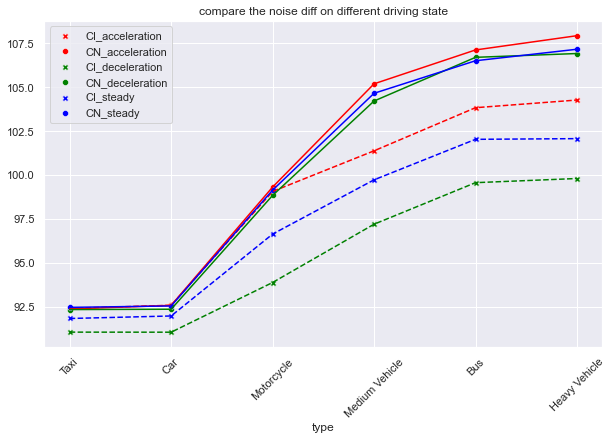

<Figure size 1440x1152 with 0 Axes>

In [100]:
plt.figure(figsize=(10,6))
plt.title("compare the noise diff on different driving state")
sns.lineplot(data=df_CI_acceleration[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),linestyle='--',color='red')
sns.lineplot(data=df_CN_acceleration[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='red')
sns.lineplot(data=df_CI_deceleration[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),linestyle='--',color='green')
sns.lineplot(data=df_CN_deceleration[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='green')
sns.lineplot(data=df_CI_stable[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),linestyle='--',color='blue')
sns.lineplot(data=df_CN_stable[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='blue')

sns.scatterplot(data=df_CI_acceleration[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='red',marker='X',label='CI_acceleration')
sns.scatterplot(data=df_CN_acceleration[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='red',label='CN_acceleration')
sns.scatterplot(data=df_CI_deceleration[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='green',marker='X',label='CI_deceleration')
sns.scatterplot(data=df_CN_deceleration[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='green',label='CN_deceleration')
sns.scatterplot(data=df_CI_stable[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='blue',marker='X',label='CI_steady')
sns.scatterplot(data=df_CN_stable[['LWA','type']].groupby('type').apply(acoustic_average).sort_values(),color='blue',label='CN_steady')
plt.xticks(rotation=45)
plt.show()
plt.savefig("images/LW_drivingMode")

1. To compare two models, CNOSSOS is higher. The reason is explained before, the Imagine acceleration term should enlarge the calculation range for acceleration. But for taxi, car, motor, the two model is similar in acceleration phase. From the plot of additional acceleration term, the CI is lagest for taxi, car and motor. Similar to the analysis by acceleration range.
2. To compare model in different driving state, accelration phase is larger than steady state and last the deceleration state, but it's not obvious for CNOSSOS. While for bus, deceleration state in origin CNOSSOS is larger than that in steady state. The speed exceeds the influence of the distance term for bus.

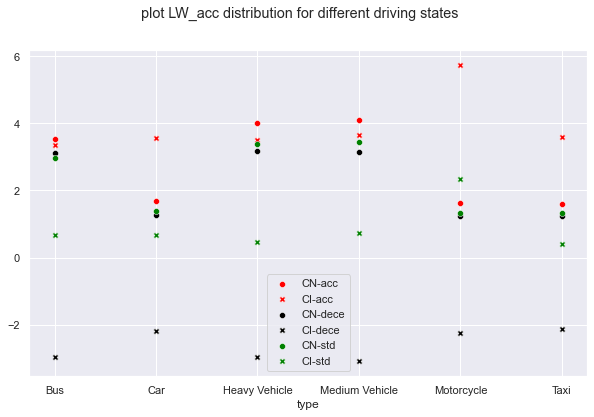

In [53]:
fig, axes = plt.subplots(1, 1, sharex=True, figsize=(10,6))
fig.suptitle('plot LW_acc distribution for different driving states')
for i,name in enumerate(['Lw_a']):

    plot_data = df_CN_acceleration.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN-acc',color='red')
    plot_data = df_CI_acceleration.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI-acc',marker="X",color='red')

    plot_data = df_CN_deceleration.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN-dece',color='black')
    plot_data = df_CI_deceleration.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI-dece',marker="X",color='black')

    plot_data = df_CN_stable.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CN-std',color='green')
    plot_data = df_CI_stable.groupby('type')[name].apply(acoustic_average)
    sns.scatterplot(x=plot_data.index,y=plot_data.values,label='CI-std',marker="X",color='green')

1. The 2 model appear similar terms in acceleration phase for taxi, car, and motorcycle.
2. The acceleration phase has the largest LWA followed by steady state and last the deceleration state.
3. the difference with driving states is obvious in imagine acceleration term, the difference appears lower in taxi and car while higher for others.

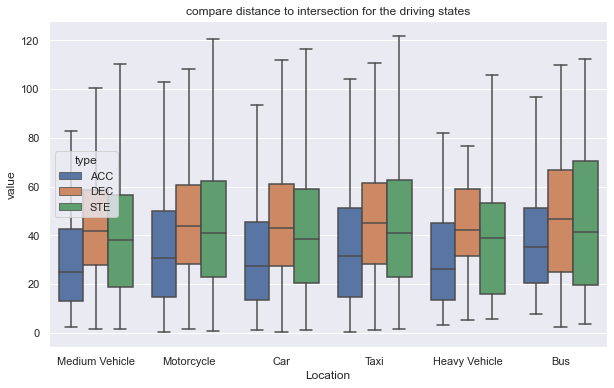

<Figure size 1440x1152 with 0 Axes>

In [87]:
# compair distance
plt.figure(figsize=(10,6))
plt.title("compare distance to intersection for the driving states")
data_plot = dict()
for i,name in enumerate(df_time.type.unique()):
    rows = int(i/3)
    cols = i%3
    concat_m = df_CI_acceleration[df_CI_acceleration.type==name]['distance']# .apply(lambda x:1-x/100 if 1-x/100 > 0 else 0).values
    concat_n = df_CI_deceleration[df_CI_deceleration.type==name]['distance']# .apply(lambda x:1-x/100  if 1-x/100 > 0 else 0).values
    concat_s = df_CI_stable[df_CI_stable.type==name]['distance']
    length = min(len(concat_m),len(concat_n),len(concat_s))
    concat_m = concat_m[:length]
    concat_n = concat_n[:length]
    concat_s = concat_s[:length]
    data = pd.DataFrame({'ACC':concat_m,'DEC':concat_n,'STE':concat_s}).assign(Location=name)
    data_plot[i] = data
cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4],data_plot[5]])
mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])
sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)    
plt.show() 
plt.savefig("images/LW_drivingMode_dis")

In [ ]:
# driving state - distribution of the speed
# main road - distance
# 
# report first => include appendix for some plots; focus on analysis
# include details, y lables ...

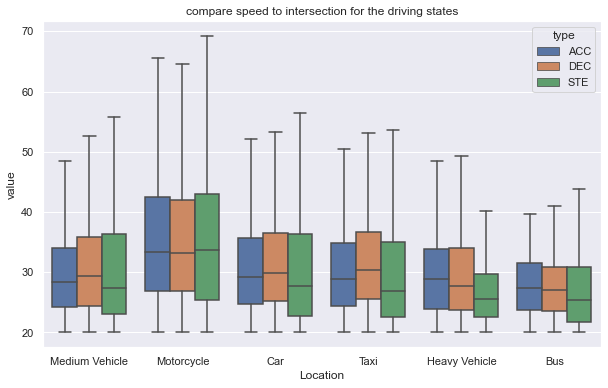

<Figure size 1440x1152 with 0 Axes>

In [112]:
# conpair speed
plt.figure(figsize=(10,6))
plt.title("compare speed to intersection for the driving states")
data_plot = dict()
for i,name in enumerate(df_time.type.unique()):
    rows = int(i/3)
    cols = i%3
    concat_m = df_CI_acceleration[df_CI_acceleration.type==name]['speed']
    concat_n = df_CI_deceleration[df_CI_deceleration.type==name]['speed']
    concat_s = df_CI_stable[df_CI_stable.type==name]['speed']
    length = min(len(concat_m),len(concat_n))
    concat_m = concat_m[:length]
    concat_n = concat_n[:length]
    concat_s = concat_s[:length]
    data = pd.DataFrame({'ACC':concat_m,'DEC':concat_n,'STE':concat_s}).assign(Location=name)
    data_plot[i] = data
cdf = pd.concat([data_plot[0], data_plot[1], data_plot[2],data_plot[3],data_plot[4],data_plot[5]])
mdf = pd.melt(cdf, id_vars=['Location'], var_name=['type'])   
sns.boxplot(x="Location", y="value", hue="type", data=mdf,showfliers = False)    
plt.show()
plt.savefig("images/LW_drivingMode_speed")

## 2.4 difference on time and position distribution

1. adding line plot to scatter can imporve the visibility of the results.
2. enlarge the acceleration calculation range for imagine model
3. when vehicle stops, should the proportion noise be considered?

In [5]:
m_CI = map_plot(df_CI,single=False)
m_CN = map_plot(df_CN,single=False)

In [1]:
# display_side_by_side(m_CI,m_CN)